## Analysis of Flood Direct and Indirect Climate Impacts on the Trans-European Transport Network (TEN-T)

This analysis examines the risk and expected direct damages and indirect loses of TEN-T corridor infrastructure to climate hazards, with specific focus on:

1. **Spatial distribution of exposed assets**: Mapping the location and extent of TEN-T infrastructure across different transport modes
2. **Flow-weighted criticality assessment**: Identifying high-priority infrastructure based on freight and passenger volumes and connected industrial activity
3. **Hazard exposure quantification**: Assessing infrastructure exposure to flooding events across different return periods
4. **Economic impact evaluation**: Quantifying direct and indirect loses, Expected Annual Damage (EAD) and Expected Annual Indirect Loses (EAIL) under current and future climate scenarios

## 1.1 Setup and Configuration

This section initializes the analysis environment by loading libraries, defining the 10 TEN-T corridors, and preparing base geographic data.

**Loaded data:**
- **European country boundaries**: Base map for spatial context
- **TEN-T corridor definitions**: 9 major corridors (A–L) with unique colors for identification
- **Utility functions**: Custom corridor extraction and visualization tools

In [4]:
import os
import re
import warnings
from pathlib import Path
from time import perf_counter
from scipy.interpolate import interp1d

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import rasterio
from rasterio.plot import show
from rasterio.enums import Resampling
from matplotlib import colors
import openpyxl
from shapely import wkb, wkt

warnings.filterwarnings('ignore')

# Configure plotting
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

# Import corridor/visualization utilities (loaded once at startup; accessed as _utils.<name> throughout)
import utils as _utils

# Corridor palette for TEN-T corridor plots
corridor_order = ['A', 'B', 'C', 'E', 'G', 'I', 'J', 'K', 'L', 'U']
corridor_names = {
    'A': 'Baltic - Adriatic',
    'B': 'North Sea - Baltic',
    'C': 'Mediterranean',
    'E': 'Scandinavian - Mediterranean',
    'G': 'Atlantic',
    'I': 'Rhine-Danube',
    'J': 'Baltic Sea - Black Sea - Aegean Sea',
    'K': 'W. Balkans-E. Mediterranean',
    'L': 'North Sea - Rhine - Mediterranean',
    'U': 'Not-in-corridor',
}
corridor_colors = {
    'A': '#0080C0',
    'B': '#E91E1E',
    'C': '#00A651',
    'E': '#FF69B4',
    'G': '#FFD700',
    'I': '#00BFFF',
    'J': '#8B4789',
    'K': '#8B4513',
    'L': '#003A0A',
    'U': '#b3b3b3',
}

# Corridor configuration and paths
TARGET_CORRIDOR_LABEL = globals().get('TARGET_CORRIDOR_LABEL', 'Rhine-Alpine')
TARGET_CORRIDOR_DATA_LABEL = globals().get('TARGET_CORRIDOR_DATA_LABEL', 'rhine-alpine')
TARGET_CORRIDOR_CODE = globals().get('TARGET_CORRIDOR_CODE', 'RALP')
TARGET_CORRIDOR_BUFFER_M = globals().get('TARGET_CORRIDOR_BUFFER_M', 50_000)
INCLUDE_IWW = globals().get('INCLUDE_IWW', True)

# ─────────────────────────────────────────────────────────────────────────────
# Path setup: corridor data directories
# ─────────────────────────────────────────────────────────────────────────────
# Data root
code_dir = Path.cwd()
root = code_dir.parent
output_dir = root / "outputs"
data_root = root / "data"
corridor_root = root / "inputs" / "country_data" / "Corridors_NUTS2" / "rhine-alpine"
flows = root / "inputs" / 'europe_corridors_with_flows'
infra = root / "inputs" / 'europe_corridors_with_flows'
selected_flows = corridor_root / 'Flows'
selected_infra = corridor_root / 'Infra'
industries = corridor_root / 'industries'
selected_nuts_dir = corridor_root

# Unified directory references
country_data_dir_local = corridor_root
country_data_dir = corridor_root
flows_dir = flows
infra_dir = infra  # Europe-wide infra (plotting + direct damage)
selected_flows_dir = selected_flows
selected_infra_dir = selected_infra  # Corridor infra (indirect loss)
industries_dir = industries
selected_nuts_dir = selected_nuts_dir
selected_nuts2_file = selected_nuts_dir / 'selected_nuts2.parquet'

# Separate infra roots by analysis purpose
europe_infra_dir = infra_dir
corridor_infra_dir = selected_infra_dir

# Europe-wide infrastructure file map (corridor plotting + direct damage)
infrastructure_files = {
    'railway_edges': europe_infra_dir / 'europe_railways_edges_TENT.parquet',
    'road_edges': europe_infra_dir / 'europe_road_edges_TENT.parquet',
    'iww_edges': europe_infra_dir / 'europe_iww_edges_TENT.parquet',
    'railway_stations': europe_infra_dir / 'europe_railways_stations_TENT.parquet',
    'iww_nodes': europe_infra_dir / 'europe_iww_nodes_TENT.parquet',
    'ports': europe_infra_dir / 'europe_ports_TENT.parquet',
    'airports': europe_infra_dir / 'europe_airports_TENT.parquet',
}

# Corridor-specific infrastructure file map (indirect loss)
corridor_infrastructure_files = {
    'railway_edges': corridor_infra_dir / 'europe_railways_edges_TENT.parquet',
    'road_edges': corridor_infra_dir / 'europe_road_edges_TENT.parquet',
    'iww_edges': corridor_infra_dir / 'europe_iww_edges_TENT.parquet',
    'railway_stations': corridor_infra_dir / 'europe_railways_stations_TENT.parquet',
    'iww_nodes': corridor_infra_dir / 'europe_iww_nodes_TENT.parquet',
    'ports': corridor_infra_dir / 'europe_ports_TENT.parquet',
    'airports': corridor_infra_dir / 'europe_airports_TENT.parquet',
}

# Hazard data directory (for enrichment workflow)
hazard_dir = root / "inputs" / "climate_hazards"
impact_dir = hazard_dir / 'Corridors' / 'rhine-alpine'

# Update globals for downstream cells
globals().update({
    'code_dir': code_dir,
    'country_data_dir_local': country_data_dir_local,
    'country_data_dir': country_data_dir,
    'flows_dir': flows_dir,
    'infra_dir': infra_dir,
    'selected_flows_dir' : selected_flows_dir,
    'selected_infra_dir' : selected_infra_dir, 
    'industries_dir': industries_dir,
    'selected_nuts_dir': selected_nuts_dir,
    'selected_nuts2_file': selected_nuts2_file,
    'hazard_dir': hazard_dir,
    'impact_dir': impact_dir,
    'europe_infra_dir': europe_infra_dir,
    'corridor_infra_dir': corridor_infra_dir,
    'infrastructure_files': infrastructure_files,
    'corridor_infrastructure_files': corridor_infrastructure_files,
    'corridor_order': corridor_order,
    'corridor_names': corridor_names,
    'corridor_colors': corridor_colors,
})

# Load Europe country boundaries for base maps (used by setup_ax and map cells)
europe_candidates = [
    data_root / 'ne_10m' / 'ne_10m_admin_0_countries.shp'
]

europe_file = _utils.pick_existing(europe_candidates)
if europe_file.exists():
    europe_countries = gpd.read_file(europe_file)
    if europe_countries.crs is None:
        europe_countries = europe_countries.set_crs('EPSG:4326', allow_override=True)
    print(f'Europe boundaries loaded: {len(europe_countries):,} features from {europe_file}')
else:
    europe_countries = gpd.GeoDataFrame()
    print(f'[WARN] Europe boundaries not found. Checked: {europe_candidates}')

globals().update({
    'europe_countries': europe_countries,
})

Europe boundaries loaded: 258 features from c:\Users\cenv0972\Downloads\UC1\data\ne_10m\ne_10m_admin_0_countries.shp


## 1.2 Load Infrastructure Data

This section loads geospatial infrastructure datasets for all transport modes across the TEN-T network.

**Infrastructure types loaded:**
- **Railway edges**: Network segments with freight and passenger flow data
- **Railway stations**: Hub locations and capacities
- **Road edges**: Network segments (where available)
- **Ports**: Maritime terminals with cargo and passenger volumes
- **Airports**: Air transport hubs with freight and passenger volumes
- **Inland waterways (IWW)**: River and canal transport routes with associated nodes

In [ ]:
print("Loading infrastructure data...\n")

infrastructure_europe = {}
for infra_type, file_path in infrastructure_files.items():
    gdf = _utils.load_infrastructure_parquet(file_path, infra_type)
    if gdf is not None:
        infrastructure_europe[infra_type] = gdf

print(f"\nLoaded {len(infrastructure_europe)} Europe-wide infrastructure types")

infrastructure_europe = _utils.reproject_infrastructure_dict(infrastructure_europe)
for infra_type, gdf in infrastructure_europe.items():
    if 'CORRIDORS' in gdf.columns:
        gdf['corridor_list'] = gdf['CORRIDORS'].apply(_utils.extract_corridors)
        gdf['primary_corridor'] = gdf['corridor_list'].apply(lambda x: x[0] if len(x) > 0 else 'Unknown')
        print(f"{infra_type}: {gdf['primary_corridor'].nunique()} unique primary corridors")

infrastructure = infrastructure_europe
globals().update({
    'infrastructure_europe': infrastructure_europe,
    'infrastructure': infrastructure,
})

LOAD_PATH_TABLES = False

nuts2_candidates = [
    globals().get('selected_nuts2_file', selected_nuts_dir / 'selected_nuts2.parquet'),
    selected_nuts_dir / 'selected_nuts2.parquet',
    country_data_dir / 'selected_nuts2.parquet',
    country_data_dir_local / 'selected_nuts2.parquet',
    data_root / 'country_data' / 'Corridors_NUTS2' / 'rhine-alpine' / 'selected_nuts2.parquet',
]

setup_ctx = _utils.prepare_corridor_data_context(
    corridor_infrastructure_files=corridor_infrastructure_files,
    infrastructure_files=infrastructure_files,
    nuts2_candidates=nuts2_candidates,
    include_iww=INCLUDE_IWW,
    target_corridor_label=TARGET_CORRIDOR_LABEL,
    target_corridor_code=TARGET_CORRIDOR_CODE,
    target_corridor_data_label=TARGET_CORRIDOR_DATA_LABEL,
    target_corridor_buffer_m=TARGET_CORRIDOR_BUFFER_M,
    target_crs='EPSG:4326',
)

globals().update(setup_ctx)

rail_edges = setup_ctx['rail_edges']
road_edges = setup_ctx['road_edges']
iww_edges = setup_ctx['iww_edges']
rail_stations = setup_ctx['rail_stations']
iww_nodes = setup_ctx['iww_nodes']
ports = setup_ctx['ports']
airports = setup_ctx['airports']
iww_ports = setup_ctx['iww_ports']
study_area = setup_ctx['study_area']
country_row = setup_ctx['country_row']
xlim, ylim = setup_ctx['xlim'], setup_ctx['ylim']
nuts2 = setup_ctx['nuts2']
_utils.nuts2 = nuts2  # utils.zoom_to_selected_nuts2 reads this as a module-level global
infra_vars = setup_ctx['infra_vars']

Loading infrastructure data...

railway_edges       : 739,849 features
road_edges          : 277,820 features
iww_edges           : 60,087 features
railway_stations    :  9,286 features
iww_nodes           : 117,881 features
ports               :  4,441 features
airports            :    116 features

Loaded 7 Europe-wide infrastructure types
railway_edges: 9 unique primary corridors
road_edges: 9 unique primary corridors
iww_edges: 5 unique primary corridors
railway_stations: 9 unique primary corridors
iww_nodes: 6 unique primary corridors
ports: 10 unique primary corridors
airports: 9 unique primary corridors
Europe-wide infra dir (plot/direct): c:\Users\cenv0972\Downloads\UC1\inputs\europe_corridors_with_flows
Corridor infra dir (indirect):      c:\Users\cenv0972\Downloads\UC1\inputs\country_data\Corridors_NUTS2\rhine-alpine\Infra
  Flows: c:\Users\cenv0972\Downloads\UC1\inputs\europe_corridors_with_flows
[rail_edges] loaded in 7.4s: c:\Users\cenv0972\Downloads\UC1\inputs\country_dat

# 2. Lifelines identification

## 2.1 Visualize All Assets by Corridor

This map displays the complete geographic extent of TEN-T infrastructure across all modes and corridors, revealing multimodal hubs and regional patterns.

**Map legend:**
- **Network edges**: Railway (thin line), roads (dashed), inland waterways (dash-dot)
- **Node facilities**: Ports (circles), airports (triangles), railway stations (squares)
- **Color coding**: Each corridor has a unique color for easy identification

This overview enables visual identification of critical infrastructure concentrations and multimodal interchange points.

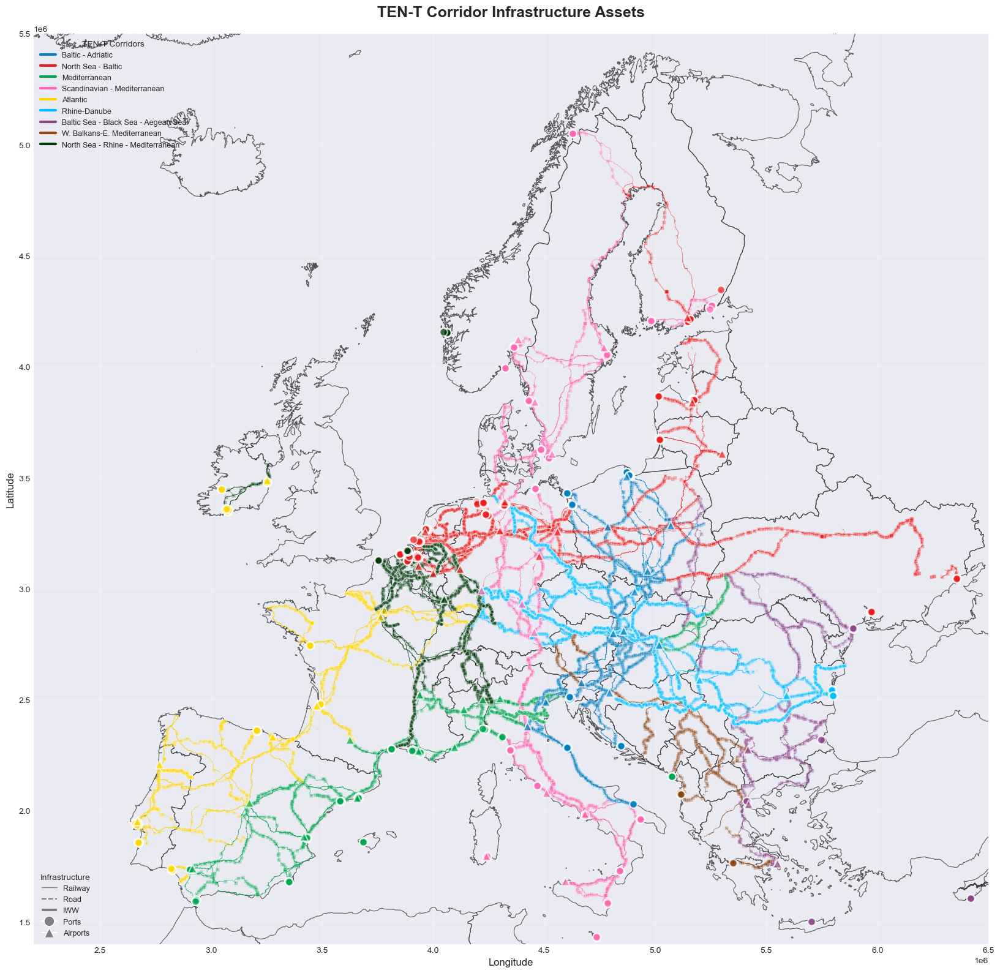

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

# Use utility function to set up the map
_utils.setup_ax(ax, europe_countries, infrastructure)

# Plot edges (railway, road, and IWW)
for infra_type in ['railway_edges', 'road_edges', 'iww_edges']:
    if infra_type in infrastructure:
        gdf = infrastructure[infra_type]
        if infra_type == 'railway_edges':
            linewidth = 0.5
        elif infra_type == 'road_edges':
            linewidth = 0.6
        else:  # iww_edges
            linewidth = 0.8
        
        for corridor in corridor_colors.keys():
            mask = gdf['primary_corridor'] == corridor
            if mask.any():
                gdf[mask].plot(
                    ax=ax,
                    color=corridor_colors[corridor],
                    linewidth=linewidth,
                    alpha=0.6,
                    zorder=2
                )

# Plot nodes (ports, airports, railway stations)
for infra_type in ['ports', 'airports', 'railway_stations', 'iww_nodes']:
    if infra_type in infrastructure:
        gdf = infrastructure[infra_type]
        
        marker = 'o' if infra_type in ['ports', 'iww_nodes'] else ('^' if infra_type == 'airports' else 's')
        size = 100 if infra_type == 'airports' else (80 if infra_type == 'ports' else 15)
        
        for corridor in corridor_colors.keys():
            mask = gdf['primary_corridor'] == corridor
            if mask.any():
                gdf[mask].plot(
                    ax=ax,
                    color=corridor_colors[corridor],
                    marker=marker,
                    markersize=size,
                    alpha=0.7 if infra_type in ['airports', 'ports'] else 0.3,
                    edgecolor='white',
                    linewidth=1.5 if infra_type in ['airports', 'ports'] else 0.5,
                    zorder=4 if infra_type in ['airports', 'ports'] else 3
                )

# Create legends
corridor_elements = [Line2D([0], [0], color=corridor_colors[code], lw=3, 
                            label=corridor_names[code]) 
                     for code in corridor_order if code != 'U']

infra_elements = [
    Line2D([0], [0], color='gray', lw=1, label='Railway'),
    Line2D([0], [0], color='gray', lw=1.5, linestyle='--', label='Road'),
    Line2D([0], [0], color='gray', lw=3, linestyle='-.', label='IWW'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
           markersize=12, label='Ports', markeredgecolor='white'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', 
           markersize=12, label='Airports', markeredgecolor='white')
]

legend1 = ax.legend(handles=corridor_elements, title='TEN-T Corridors', 
                   loc='upper left', fontsize=9, title_fontsize=10)
ax.add_artist(legend1)
ax.legend(handles=infra_elements, title='Infrastructure', 
         loc='lower left', fontsize=9, title_fontsize=10)

ax.set_title('TEN-T Corridor Infrastructure Assets', fontsize=18, fontweight='bold', pad=20)
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)

plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'tent_assets.png')

## 2.2 Freight Flows Visualization

These maps reveal where high-volume freight movements are concentrated across the TEN-T network. Major corridors  show elevated volumes due to their central European position and industrial connectivity.

**Visualization method:**
- **Four panels**: One for each transport mode (rail, IWW, ports, airports)
- **Line width**: Proportional to annual freight volume (MT/year); thicker = higher tonnage
- **Bubble size**: Proportional to total annual freight handled; larger = higher capacity

Identifying freight corridors helps prioritize disruption planning and adaptation efforts.

Preparing freight flow visualization...



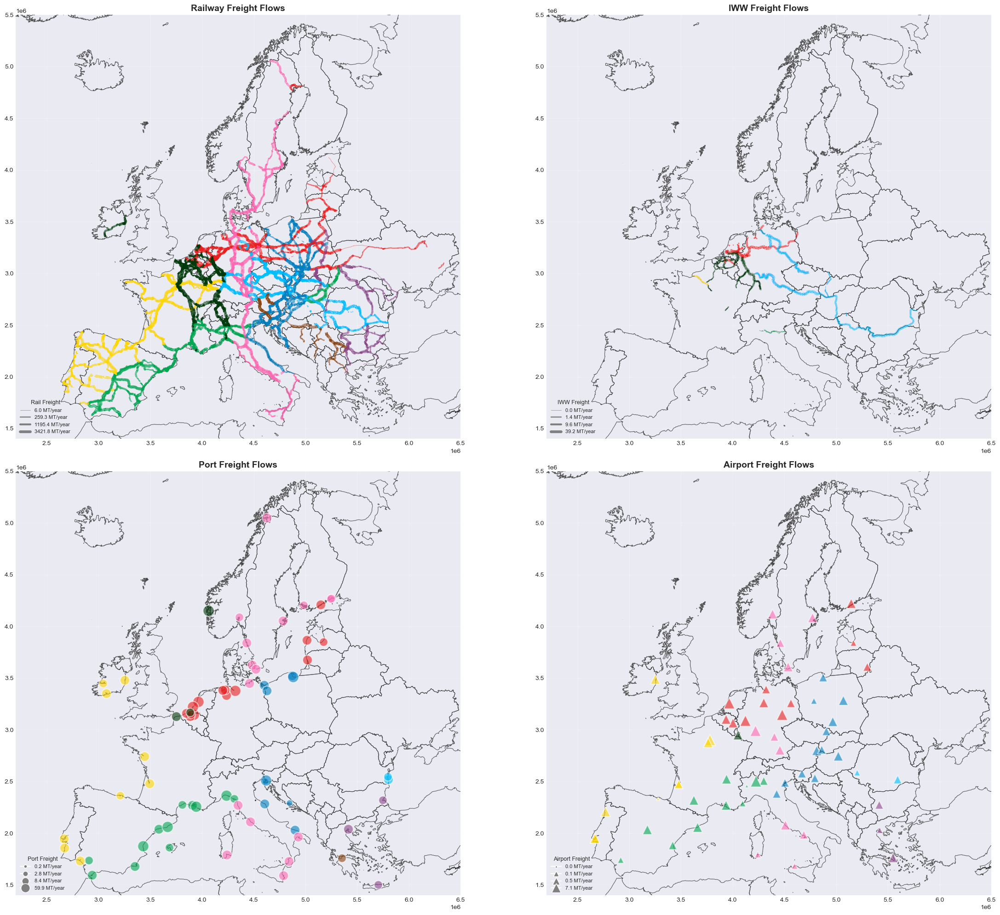

<Figure size 640x480 with 0 Axes>

In [8]:
# Prepare freight flow data
print("Preparing freight flow visualization...\n")

# Aggregate ports by port_code
if 'ports' in infrastructure:
    freight_cols = [col for col in infrastructure['ports'].columns if 'freight' in col.lower() and 'computed' in col.lower()]
    ports_agg = _utils.aggregate_by_location(infrastructure['ports'], 'port_code', freight_cols, 'total_freight')
    if ports_agg is not None:
        infrastructure['ports_agg'] = ports_agg

# Aggregate airports
if 'airports' in infrastructure:
    freight_cols = [col for col in infrastructure['airports'].columns if 'freight' in col.lower() and 'computed' in col.lower()]
    if freight_cols:
        infrastructure['airports']['total_freight'] = infrastructure['airports'][freight_cols].fillna(0).sum(axis=1)


fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()

# Railway freight flows
_utils.setup_ax(axes[0], europe_countries, infrastructure, 'Railway Freight Flows')
if 'railway_edges' in infrastructure and 'flow_rail_freight' in infrastructure['railway_edges'].columns:
    railway_with_flow = infrastructure['railway_edges'][infrastructure['railway_edges']['flow_rail_freight'] > 0].copy()
    
    if len(railway_with_flow) > 0:
        p05, p35, p65, p95 = railway_with_flow['flow_rail_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        railway_with_flow['linewidth'] = railway_with_flow['flow_rail_freight'].apply(
            lambda x: _utils.get_linewidth_freight(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[0], railway_with_flow, corridor_colors, 'linewidth')
        
        # Add legend
        line_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='MT/year', is_freight=True)
        axes[0].legend(handles=line_legend, title='Rail Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# IWW freight flows
_utils.setup_ax(axes[1], europe_countries, infrastructure, 'IWW Freight Flows')
if 'iww_edges' in infrastructure and 'flow_iww_freight' in infrastructure['iww_edges'].columns:
    iww_with_flow = infrastructure['iww_edges'][infrastructure['iww_edges']['flow_iww_freight'] > 0].copy()
    
    if len(iww_with_flow) > 0:
        p05, p35, p65, p95 = iww_with_flow['flow_iww_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        iww_with_flow['linewidth'] = iww_with_flow['flow_iww_freight'].apply(
            lambda x: _utils.get_linewidth_freight(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[1], iww_with_flow, corridor_colors, 'linewidth')
        
        line_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='MT/year', is_freight=True)
        axes[1].legend(handles=line_legend, title='IWW Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Port freight flows
_utils.setup_ax(axes[2], europe_countries, infrastructure, 'Port Freight Flows')
if 'ports_agg' in infrastructure:
    ports_with_flow = infrastructure['ports_agg'][infrastructure['ports_agg']['total_freight'] > 0].copy()
    
    if len(ports_with_flow) > 0:
        p05, p35, p65, p95 = ports_with_flow['total_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        ports_with_flow['markersize'] = ports_with_flow['total_freight'].apply(
            lambda x: _utils.get_markersize_freight(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[2], ports_with_flow, corridor_colors, 'markersize', marker='o')
        
        bubble_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='MT/year', marker='o', is_freight=True)
        axes[2].legend(handles=bubble_legend, title='Port Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Airport freight flows
_utils.setup_ax(axes[3], europe_countries, infrastructure, 'Airport Freight Flows')
if 'airports' in infrastructure and 'total_freight' in infrastructure['airports'].columns:
    airports_with_flow = infrastructure['airports'][infrastructure['airports']['total_freight'] > 0].copy()
    
    if len(airports_with_flow) > 0:
        p05, p35, p65, p95 = airports_with_flow['total_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        airports_with_flow['markersize'] = airports_with_flow['total_freight'].apply(
            lambda x: _utils.get_markersize_freight(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[3], airports_with_flow, corridor_colors, 'markersize', marker='^')
        
        bubble_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='MT/year', marker='^', is_freight=True)
        axes[3].legend(handles=bubble_legend, title='Airport Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'freight_flows.png')

## 2.3 Passenger Flows Visualization

These maps identify major passenger movement corridors, which concentrate around metropolitan areas and tourist destinations. Disruptions to high-volume passenger routes have significant socioeconomic impacts on mobility and tourism.

**Visualization method:**
- **Three panels**: Railway, ports (ferries/cruises), and airports
- **Line width** (railway): Proportional to annual passenger volume (millions of trips/year)
- **Bubble size** (ports/airports): Proportional to annual passenger throughput

Passenger infrastructure disruptions can affect both economic activity and quality of life, making these corridors critical for resilience planning.

Preparing passenger flow visualization...



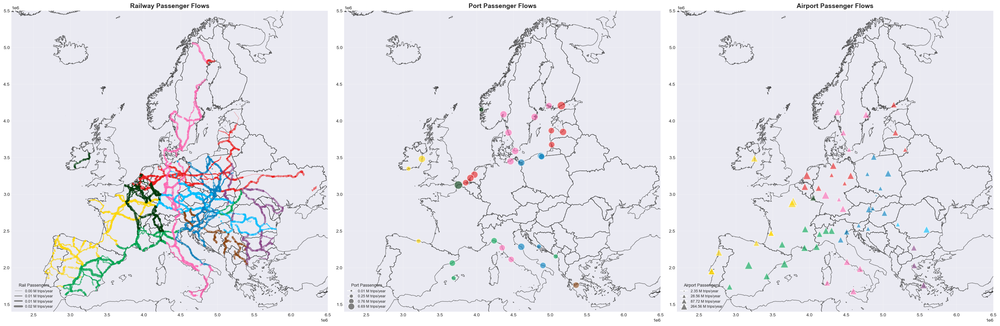

<Figure size 640x480 with 0 Axes>

In [9]:
# Prepare passenger flow data
print("Preparing passenger flow visualization...\n")

# Aggregate ports by port_code for passengers
if 'ports' in infrastructure:
    passenger_cols = [col for col in infrastructure['ports'].columns if 'passenger' in col.lower() and 'computed' in col.lower()]
    ports_pass_agg = _utils.aggregate_by_location(infrastructure['ports'], 'port_code', passenger_cols, 'total_passenger')
    if ports_pass_agg is not None:
        infrastructure['ports_pass_agg'] = ports_pass_agg

# Aggregate airports for passengers
if 'airports' in infrastructure:
    passenger_cols = [col for col in infrastructure['airports'].columns if 'passenger' in col.lower() and 'computed' in col.lower()]
    if passenger_cols:
        infrastructure['airports']['total_passenger'] = infrastructure['airports'][passenger_cols].fillna(0).sum(axis=1)

fig, axes = plt.subplots(1, 3, figsize=(30, 12))

# Railway passenger flows
_utils.setup_ax(axes[0], europe_countries, infrastructure, 'Railway Passenger Flows')
if 'railway_edges' in infrastructure and 'flow_rail_passenger' in infrastructure['railway_edges'].columns:
    railway_with_flow = infrastructure['railway_edges'][infrastructure['railway_edges']['flow_rail_passenger'] > 0].copy()
    
    if len(railway_with_flow) > 0:
        p05, p35, p65, p95 = railway_with_flow['flow_rail_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        railway_with_flow['linewidth'] = railway_with_flow['flow_rail_passenger'].apply(
            lambda x: _utils.get_linewidth_passenger(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[0], railway_with_flow, corridor_colors, 'linewidth')
        
        line_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='M trips/year', is_freight=False)
        axes[0].legend(handles=line_legend, title='Rail Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Port passenger flows
_utils.setup_ax(axes[1], europe_countries, infrastructure, 'Port Passenger Flows')
if 'ports_pass_agg' in infrastructure:
    ports_with_flow = infrastructure['ports_pass_agg'][infrastructure['ports_pass_agg']['total_passenger'] > 0].copy()
    
    if len(ports_with_flow) > 0:
        p05, p35, p65, p95 = ports_with_flow['total_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        ports_with_flow['markersize'] = ports_with_flow['total_passenger'].apply(
            lambda x: _utils.get_markersize_passenger(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[1], ports_with_flow, corridor_colors, 'markersize', marker='o')
        
        bubble_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='M trips/year', marker='o', is_freight=False)
        axes[1].legend(handles=bubble_legend, title='Port Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Airport passenger flows
_utils.setup_ax(axes[2], europe_countries, infrastructure, 'Airport Passenger Flows')
if 'airports' in infrastructure and 'total_passenger' in infrastructure['airports'].columns:
    airports_with_flow = infrastructure['airports'][infrastructure['airports']['total_passenger'] > 0].copy()
    
    if len(airports_with_flow) > 0:
        p05, p35, p65, p95 = airports_with_flow['total_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        airports_with_flow['markersize'] = airports_with_flow['total_passenger'].apply(
            lambda x: _utils.get_markersize_passenger(x, (p05, p35, p65, p95))
        )
        _utils.plot_by_corridor_and_visual_attr(axes[2], airports_with_flow, corridor_colors, 'markersize', marker='^')
        
        bubble_legend = _utils.create_flow_legend((p05, p35, p65, p95), unit='M trips/year', marker='^', is_freight=False)
        axes[2].legend(handles=bubble_legend, title='Airport Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'passenger_flows.png')

## 2.4 Industry Locations

This section loads the inputs needed to calculate industry-level disruption costs: the industrial OD matrix, the industry location layer, and the country-sector `kfactor` lookup. These tables are used by the enrichment workflow to translate disrupted freight movements into monetary loss estimates.

It is mostly a data-preparation step. The code checks the available file locations, reads the first matching file for each input, and reports the shapes and columns so later cells can rely on them with less guessing.


In [ ]:

# ── Industrial OD (required by enrichment cell) ───────────────────────────────
industrial_od_candidates = [
    country_data_dir_local / 'industries' / 'industrial_OD_threshold_0.25.parquet',
    ]

industrial_od_file = _utils.pick_existing(industrial_od_candidates)
industrial_od = _utils.safe_read_parquet_any(industrial_od_file) if industrial_od_file.exists() else pd.DataFrame()

# ── Industry locations ─────────────────────────────────────────────────────────
industrial_location_candidates = [
    country_data_dir_local / 'industries' / 'industries_with_closest_ports_airports_euclidean.parquet',
    ]
industrial_locations_file = _utils.pick_existing(industrial_location_candidates)
industry_locs = _utils.read_parquet_as_gdf(industrial_locations_file) if industrial_locations_file.exists() else gpd.GeoDataFrame()
print(f'\nindustry_locations: {len(industry_locs):,} rows')

# ── kfactor lookup (country × sector) ─────────────────────────────────────────
SECTOR_CODE_TO_NAME = {
    'IL': 'intensive livestock',
    'PW': 'paper and wood',
    'FB': 'food and beverage',
    'MI': 'minerals',
    'MT': 'metals',
    'CO': 'commercial',
    'CH': 'chemicals',
}

kfactor_candidates = [
    data_root / 'costs' / 'kfactor.xlsx',
    root / 'data' / 'costs' / 'kfactor.xlsx'
]
kfactor_file = _utils.pick_existing(kfactor_candidates)
kfactor_raw = pd.read_excel(kfactor_file, sheet_name=0) if kfactor_file.exists() else pd.DataFrame()

if kfactor_raw.empty:
    kfactor_df = pd.DataFrame(columns=['region', 'sector_code', 'sector_name', 'kfactor'])
    kfactor_dict = {}
    print(f'\n[WARN] kfactor lookup not loaded. Checked: {kfactor_candidates}')
else:
    kfactor_df = kfactor_raw.rename(columns={'k_factor': 'kfactor'}).copy()
    if 'product' in kfactor_df.columns:
        kfactor_df['sector_code'] = (
            kfactor_df['product']
            .astype(str)
            .str.replace('CPA_', '', regex=False)
            .str.strip()
            .str.upper()
        )
    else:
        kfactor_df['sector_code'] = ''

    kfactor_df['sector_name'] = (
        kfactor_df['sector_code']
        .map(SECTOR_CODE_TO_NAME)
        .fillna(kfactor_df['sector_code'].str.lower())
        .astype(str)
        .str.strip()
        .str.lower()
    )

    if 'region' not in kfactor_df.columns:
        kfactor_df['region'] = ''

    kfactor_df['kfactor'] = pd.to_numeric(kfactor_df['kfactor'], errors='coerce')
    kfactor_df = kfactor_df.dropna(subset=['kfactor'])
    kfactor_df = kfactor_df[kfactor_df['sector_name'].ne('')].copy()
    kfactor_dict = kfactor_df.groupby('sector_name')['kfactor'].mean().to_dict()


globals().update({
    'SECTOR_CODE_TO_NAME': SECTOR_CODE_TO_NAME,
    'kfactor_file': kfactor_file,
    'kfactor_raw': kfactor_raw,
    'kfactor_df': kfactor_df,
    'kfactor_dict': kfactor_dict,
})


industry_locations: 46,186 rows
  file: c:\Users\cenv0972\Downloads\UC1\inputs\country_data\Corridors_NUTS2\rhine-alpine\industries\industries_with_closest_ports_airports_euclidean.parquet (exists=True)
  columns: ['id', 'nuts2', 'eprtr_sectors', 'eea_activities', 'area', 'area_nuts2', 'longitude', 'latitude', 'closest_port', 'closest_airport', 'closest_iww_port', 'closest_node']


# 3. Direct Damages: River flood assessment of freight railway system for the North Sea - Rhine - Mediterranean corridor

The North Sea–Rhine–Mediterranean (NSRM) corridor is one of nine Trans-European Transport Network (TEN-T) corridors that act as primary arteries moving goods and people to their destinations. Stretching across eight countries, the NSRM comprises roughly 12,150 km of rail, 5,000 km of road, and 5,030 km of inland waterways. The network is a vital economic artery and handles over 15% of Europe's road freight, more than 44% of rail freight, and nearly 90% of inland waterway freight. Major gateways like Rotterdam, Antwerp, and Amsterdam serve as the heart of trade logistics connecting European industry to global trade. Given the breadth and complexity of the disruption and indirect losses analysis, we now focus on presenting the results for this main corridor. The results can be replicated to any of the other TEN-T corridors.

This section quantifies the direct economic impacts of river flooding on railway infrastructure under both current and future climate conditions.

**Analysis scope:**
1. **Exposure quantification**: Length of railway segments with flood exposure at multiple return periods
2. **Damage assessment**: Direct economic loss based on flood depth and infrastructure replacement value
3. **Risk metrics**: Current conditions and climate change scenarios (1.5°C – 4.0°C warming)
4. **Temporal evolution**: How flood frequency and associated losses change under different warming trajectories

Loading railway flood risk data from the Rhine-Alpine hazard parquet...

Source: c:\Users\cenv0972\Downloads\UC1\inputs\climate_hazards\Corridors\rhine-alpine\TENT_rail_river.parquet
Merged railway edges with risk data: 739,849 rows


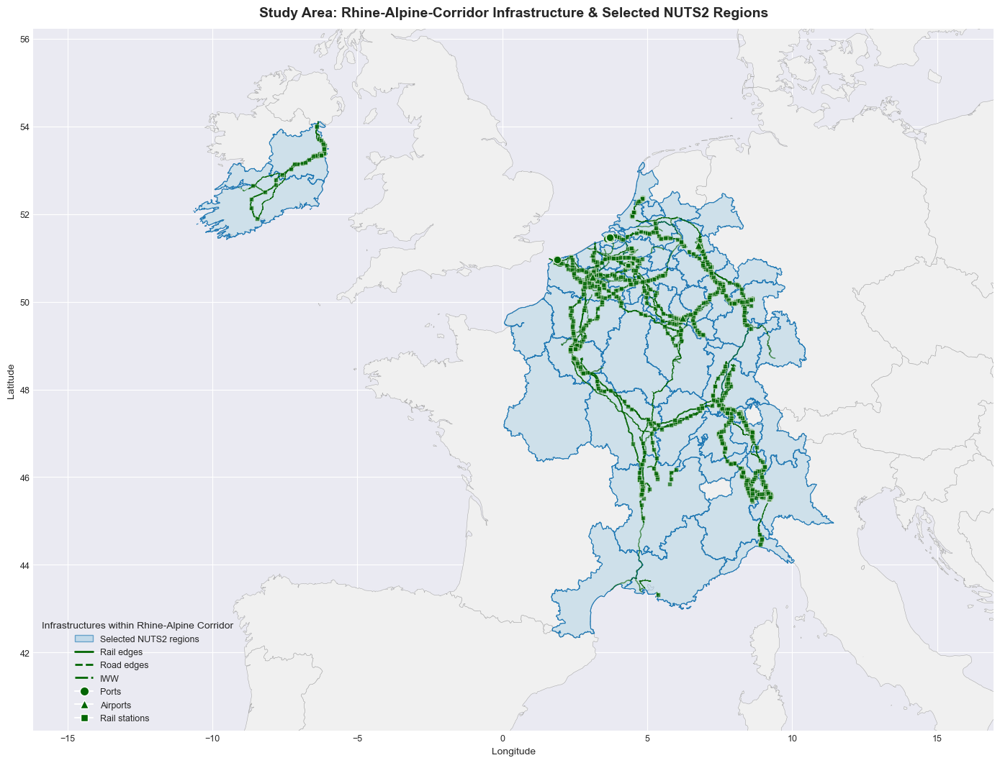

In [11]:
# Load railway risk data from the Rhine-Alpine hazard parquet
risk_dir = code_dir.parent / "inputs" / "climate_hazards" / "Corridors" / "rhine-alpine"
rail_risk_path = risk_dir / "TENT_rail_river.parquet"

print("Loading railway flood risk data from the Rhine-Alpine hazard parquet...\n")
print(f"Source: {rail_risk_path}")

# Load the parquet and inspect its schema first
rail_risk = pd.read_parquet(rail_risk_path)

# Map the parquet columns onto the names expected by the plotting cells
if "EAD_mid_river_current" in rail_risk.columns and "mean_damage_100" not in rail_risk.columns:
    rail_risk["mean_damage_100"] = rail_risk["EAD_mid_river_current"]
if "exposure_length_river_RP100" in rail_risk.columns and "exposure_100" not in rail_risk.columns:
    rail_risk["exposure_100"] = rail_risk["exposure_length_river_RP100"]
if "EAD_mid_river_current" in rail_risk.columns and "EAD" not in rail_risk.columns:
    rail_risk["EAD"] = rail_risk["EAD_mid_river_current"]
if "vuln_ratio_river_RP100" in rail_risk.columns and "pct_damage_100" not in rail_risk.columns:
    rail_risk["pct_damage_100"] = rail_risk["vuln_ratio_river_RP100"] * 100.0

# Add simple scenario placeholders from the same parquet file so later cells can run
scenario_sources = {
    "1.5C": "EAD_mid_river_2050_SSP245",
    "2.0C": "EAD_mid_river_2050_SSP585",
    "3.0C": "EAD_mid_river_2100_SSP245",
    "4.0C": "EAD_mid_river_2100_SSP585",
}
for scenario, source in scenario_sources.items():
    if source in rail_risk.columns:
        rail_risk[f"damage_cc_{scenario}"] = rail_risk[source]
        rail_risk[f"EAD_{scenario}"] = rail_risk[source]
        rail_risk[f"adjusted_rp_100_{scenario}"] = 100.0

# Merge the parquet-based risk table onto the railway geometry
if "railway_edges" in infrastructure:
    railway_with_risk = infrastructure["railway_edges"].copy()
    merge_cols = ["id"] + [c for c in rail_risk.columns if c not in railway_with_risk.columns and c != "geometry"]
    railway_with_risk = railway_with_risk.merge(
        rail_risk[merge_cols],
        on="id",
        how="left",
    )
    print(f"Merged railway edges with risk data: {len(railway_with_risk):,} rows")
else:
    print("\nWarning: Railway edges not loaded in infrastructure data")
    railway_with_risk = gpd.GeoDataFrame()

# Ensure the plotting columns are numeric
for col in ["mean_damage_100", "exposure_100", "EAD", "pct_damage_100"]:
    if col in railway_with_risk.columns:
        railway_with_risk[col] = pd.to_numeric(railway_with_risk[col], errors="coerce").fillna(0.0)

railway_exposed = (
    railway_with_risk[railway_with_risk["exposure_100"] > 0].copy()
    if "exposure_100" in railway_with_risk.columns
    else railway_with_risk.copy()
)

# ── Study area overview: Europe + L-corridor infrastructure + selected NUTS2 ──
_INFRA_GREEN = "#036603"

fig_ov, ax_ov = plt.subplots(1, 1, figsize=(14, 16))

# 1) Europe background
if isinstance(europe_countries, gpd.GeoDataFrame) and not europe_countries.empty:
    _ec = europe_countries.to_crs("EPSG:4326") if europe_countries.crs and str(europe_countries.crs) != "EPSG:4326" else europe_countries
    _ec.plot(ax=ax_ov, color="#f0f0f0", edgecolor="#aaaaaa", linewidth=0.4, zorder=1)

# 2) Selected NUTS2 highlighted
if isinstance(nuts2, gpd.GeoDataFrame) and not nuts2.empty:
    _nuts2_plot = nuts2.to_crs("EPSG:4326") if nuts2.crs and str(nuts2.crs) != "EPSG:4326" else nuts2
    _nuts2_plot.plot(
        ax=ax_ov,
        color="#a6cee3",
        edgecolor="#1f78b4",
        linewidth=0.7,
        alpha=0.45,
        zorder=2,
    )
    _nuts2_plot.boundary.plot(ax=ax_ov, color="#1f78b4", linewidth=0.8, zorder=3)
else:
    _nuts2_plot = None


def _to_4326(gdf):
    if gdf is None or (isinstance(gdf, gpd.GeoDataFrame) and gdf.empty):
        return gdf
    if gdf.crs is None or str(gdf.crs) == "EPSG:4326":
        return gdf
    try:
        return gdf.to_crs("EPSG:4326")
    except Exception:
        return gdf


def _filter_has_L_in_corridor(gdf):
    """Keep rows where CORRIDOR(S) includes token L (alone or with other letters)."""
    if gdf is None or (isinstance(gdf, gpd.GeoDataFrame) and gdf.empty):
        return gdf

    corridor_cols = [c for c in ("CORRIDOR", "CORRIDORS", "corridor", "corridors") if c in gdf.columns]
    if not corridor_cols:
        return gpd.GeoDataFrame(columns=gdf.columns, crs=gdf.crs)

    # Accept forms like: L, A|L, L|B, A;L, A,L
    token_pat = r"(^|[|,;\s])L($|[|,;\s])"

    mask = pd.Series(False, index=gdf.index)
    for col in corridor_cols:
        ser = (
            gdf[col]
            .astype(str)
            .str.upper()
            .str.replace("/", "|", regex=False)
            .str.replace("-", "|", regex=False)
        )
        mask = mask | ser.str.contains(token_pat, regex=True, na=False)

    return gdf[mask].copy()


# 3) Infrastructure filtered to L in CORRIDOR(S), all green
_rail = _to_4326(_filter_has_L_in_corridor(globals().get("rail_edges")))
_road = _to_4326(_filter_has_L_in_corridor(globals().get("road_edges")))
_iww = _to_4326(_filter_has_L_in_corridor(globals().get("iww_edges")))
_ports = _to_4326(_filter_has_L_in_corridor(globals().get("ports")))
_air = _to_4326(_filter_has_L_in_corridor(globals().get("airports")))
_rail_st = _to_4326(_filter_has_L_in_corridor(globals().get("rail_stations")))

_legend_handles = []

if _rail is not None and not _rail.empty:
    _rail.plot(ax=ax_ov, color=_INFRA_GREEN, linewidth=1.2, alpha=0.85, zorder=5)
    _legend_handles.append(Line2D([0], [0], color=_INFRA_GREEN, lw=2, label="Rail edges"))

if _road is not None and not _road.empty:
    _road.plot(ax=ax_ov, color=_INFRA_GREEN, linewidth=0.8, alpha=0.7, zorder=4, linestyle="--")
    _legend_handles.append(Line2D([0], [0], color=_INFRA_GREEN, lw=2, ls="--", label="Road edges"))

if _iww is not None and not _iww.empty:
    _iww.plot(ax=ax_ov, color=_INFRA_GREEN, linewidth=1.0, alpha=0.8, zorder=4, linestyle="-.")
    _legend_handles.append(Line2D([0], [0], color=_INFRA_GREEN, lw=2, ls="-.", label="IWW"))

if _ports is not None and not _ports.empty:
    _ports.plot(ax=ax_ov, color=_INFRA_GREEN, markersize=55, marker="o", alpha=0.9, edgecolor="white", linewidth=0.6, zorder=7)
    _legend_handles.append(Line2D([0], [0], marker="o", color="w", markerfacecolor=_INFRA_GREEN, markersize=9, label="Ports", markeredgecolor="white"))

if _air is not None and not _air.empty:
    _air.plot(ax=ax_ov, color=_INFRA_GREEN, markersize=60, marker="^", alpha=0.9, edgecolor="white", linewidth=0.6, zorder=7)
    _legend_handles.append(Line2D([0], [0], marker="^", color="w", markerfacecolor=_INFRA_GREEN, markersize=9, label="Airports", markeredgecolor="white"))

if _rail_st is not None and not _rail_st.empty:
    _rail_st.plot(ax=ax_ov, color=_INFRA_GREEN, markersize=18, marker="s", alpha=0.7, edgecolor="white", linewidth=0.4, zorder=6)
    _legend_handles.append(Line2D([0], [0], marker="s", color="w", markerfacecolor=_INFRA_GREEN, markersize=7, label="Rail stations", markeredgecolor="white"))

from matplotlib.patches import Patch
_legend_handles.insert(0, Patch(facecolor="#a6cee3", edgecolor="#1f78b4", alpha=0.6, label="Selected NUTS2 regions"))

# 4) Extent
if _nuts2_plot is not None and not _nuts2_plot.empty:
    _bb = _nuts2_plot.total_bounds
    _pad_x = (_bb[2] - _bb[0]) * 0.25
    _pad_y = (_bb[3] - _bb[1]) * 0.18
    ax_ov.set_xlim(_bb[0] - _pad_x, _bb[2] + _pad_x)
    ax_ov.set_ylim(_bb[1] - _pad_y, _bb[3] + _pad_y)
else:
    ax_ov.set_xlim(-2, 20)
    ax_ov.set_ylim(42, 57)

ax_ov.legend(
    handles=_legend_handles,
    loc="lower left",
    fontsize=9,
    title="Infrastructures within Rhine-Alpine Corridor",
    title_fontsize=10,
    framealpha=0.9,
)
ax_ov.set_title("Study Area: Rhine-Alpine-Corridor Infrastructure & Selected NUTS2 Regions", fontsize=14, fontweight="bold", pad=12)
ax_ov.set_xlabel("Longitude", fontsize=10)
ax_ov.set_ylabel("Latitude", fontsize=10)
ax_ov.tick_params(labelsize=9)
plt.tight_layout()
plt.show()

## 3.1 Current Impacts

These maps show complementary views of current-day railway flood risk under a RP100 (100-year) event scenario:

1. **Exposed Length**: Meters of track with flood hazard exposure (identifies vulnerable segments)
2. **Damage Percentage**: Proportion of asset value at risk (capped at 100% for visualization)
3. **Direct Damage (log scale)**: Absolute repair/replacement cost in euros (identifies high-value loss hotspots)


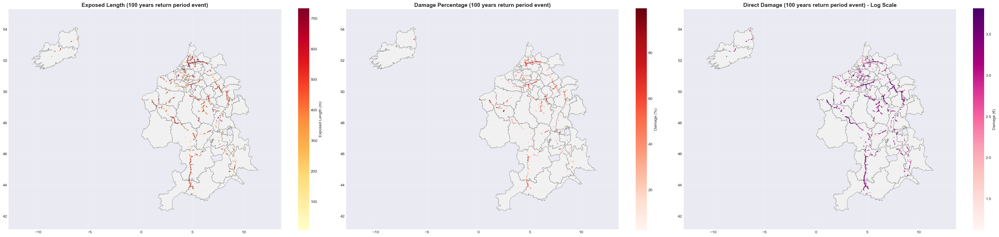

<Figure size 640x480 with 0 Axes>

In [12]:
fig, axes = plt.subplots(1, 3, figsize=(36, 10))
axes = axes.flatten()

# 1. Exposed Length (m)
_utils.setup_ax(axes[0], europe_countries, infrastructure, 'Exposed Length (100 years return period event)')
railway_exposed_plot = _utils.ensure_gdf_crs(railway_exposed.copy(), target_crs='EPSG:4326')
_utils.zoom_to_selected_nuts2(axes[0], railway_exposed_plot)
# Normalize colormap to p05-p95 range for better visibility
vmin_exp = railway_exposed_plot['exposure_100'].quantile(0.05)
vmax_exp = railway_exposed_plot['exposure_100'].quantile(0.95)
railway_exposed_plot.plot(
    ax=axes[0],
    column='exposure_100',
    cmap='YlOrRd',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Exposed Length (m)', 'shrink': 0.8},
    vmin=vmin_exp,
    vmax=vmax_exp
)

# 2. Damage Percentage
_utils.setup_ax(axes[1], europe_countries, infrastructure, 'Damage Percentage (100 years return period event)')
railway_exposed_capped = railway_exposed.copy()
railway_exposed_capped['pct_damage_100_capped'] = railway_exposed_capped['pct_damage_100'].clip(upper=100)
railway_exposed_capped_plot = _utils.ensure_gdf_crs(railway_exposed_capped.copy(), target_crs='EPSG:4326')
_utils.zoom_to_selected_nuts2(axes[1], railway_exposed_capped_plot)
# Cap at 100% for visualization
vmin_pct = railway_exposed_capped_plot['pct_damage_100_capped'].quantile(0.05)
vmax_pct = railway_exposed_capped_plot['pct_damage_100_capped'].quantile(0.95)
railway_exposed_capped_plot.plot(
    ax=axes[1],
    column='pct_damage_100_capped',
    cmap='Reds',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Damage (%)', 'shrink': 0.8},
    vmin=vmin_pct,
    vmax=vmax_pct
)

# 3. Direct Damage (RP100) - Log Scale
_utils.setup_ax(axes[2], europe_countries, infrastructure, 'Direct Damage (100 years return period event) - Log Scale')
railway_exposed_dmg = railway_exposed.copy()
railway_exposed_dmg['log_mean_damage_100'] = np.log10(railway_exposed_dmg['mean_damage_100'].replace(0, np.nan))
railway_exposed_dmg_plot = _utils.ensure_gdf_crs(railway_exposed_dmg.copy(), target_crs='EPSG:4326')
_utils.zoom_to_selected_nuts2(axes[2], railway_exposed_dmg_plot)
# Use log10 transformation for better visualization of wide range
vmin_dmg = railway_exposed_dmg_plot['log_mean_damage_100'].quantile(0.05)
vmax_dmg = railway_exposed_dmg_plot['log_mean_damage_100'].quantile(0.95)
railway_exposed_dmg_plot.plot(
    ax=axes[2],
    column='log_mean_damage_100',
    cmap='RdPu',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Damage (€)', 'shrink': 0.8},
    vmin=vmin_dmg,
    vmax=vmax_dmg
)
# Format colorbar with powers of 10
cbar_dmg = axes[2].collections[-1].colorbar
_utils.format_log_colorbar(cbar_dmg)


plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'direct_impacts.png')

## 3.2 Expected Annual Damage (EAD) 

This is the primary metric for long-term infrastructure planning and adaptation investment. It translates probabilistic risk across all return periods into a single actionable figure.

**EAD calculation:**   EAD = Σ(Damage at RP) × (Annual Probability of RP)

EAD represents the annualized budget needed for repairs/replacements over the long term

Loaded LAU EAD/EAIL results: 45,371 LAUs from c:\Users\cenv0972\Downloads\UC1\inputs\risk\River_Flood\indirect\LAU_L_river.parquet


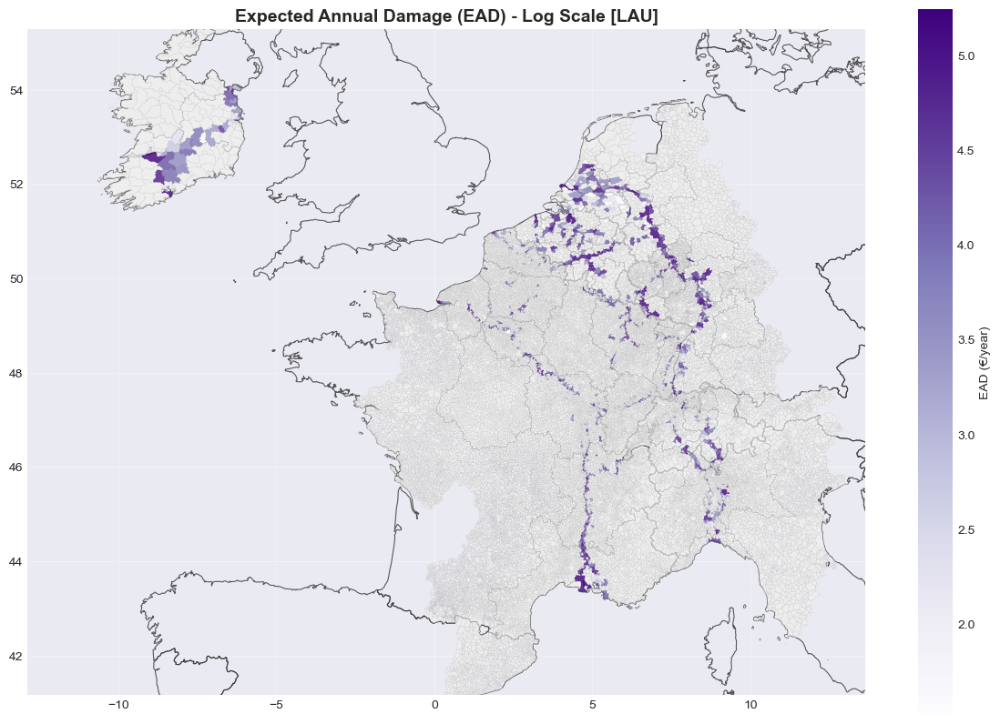

<Figure size 640x480 with 0 Axes>

In [13]:
# -- Load LAU-level EAD/EAIL results (from 05_aggregate_results_by_LAU.py) --
LAU_RESULTS_DIR = root / 'inputs' / 'risk' / 'River_Flood' / 'indirect'  # adjust if you copy the 05 output elsewhere
LAU_RESULTS_FILE = LAU_RESULTS_DIR / 'LAU_L_river.parquet'

if LAU_RESULTS_FILE.exists():
    lau_ead_eail = gpd.read_parquet(LAU_RESULTS_FILE)
    if lau_ead_eail.crs is None:
        lau_ead_eail = lau_ead_eail.set_crs('EPSG:3035', allow_override=True)
    lau_ead_eail = lau_ead_eail.to_crs('EPSG:4326')
    print(f"Loaded LAU EAD/EAIL results: {len(lau_ead_eail):,} LAUs from {LAU_RESULTS_FILE}")
else:
    lau_ead_eail = gpd.GeoDataFrame()
    print(f"[WARN] LAU results not found at {LAU_RESULTS_FILE}.")
    print("       Copy the output of 05_aggregate_results_by_LAU.py there (or update LAU_RESULTS_FILE above)")
    print("       before running the EAD/EAIL plots below -- they will show 'no data' until then.")

fig_lau_ead, ax_lau_ead = plt.subplots(1, 1, figsize=(12, 10))
_utils.plot_lau_choropleth(
    ax_lau_ead, lau_ead_eail, 'EAD', 'Expected Annual Damage (EAD) - Log Scale [LAU]',
    cmap='Purples', log=True, legend_label='EAD (€/year)', europe_countries=europe_countries,
)
plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'present_ead_lau_map.png')


## 3.2 Climate Change Scenarios: Expected Annual Damage (EAD)

- Higher warming scenarios → higher EAD → greater investment needs
- EAD ratios (scenario / baseline) show how much adaptation budgets must increase

**Four climate scenarios:** 1.5°C, 2.0°C, 3.0°C, and 4.0°C warming above pre-industrial levels.

Interpolating damages for climate change scenarios...


Damage interpolation completed
Checking EAD columns for climate scenarios:
  EAD_1.5C: €138.90 million/year
  EAD_2.0C: €191.19 million/year
  EAD_3.0C: €222.34 million/year
  EAD_4.0C: €276.04 million/year


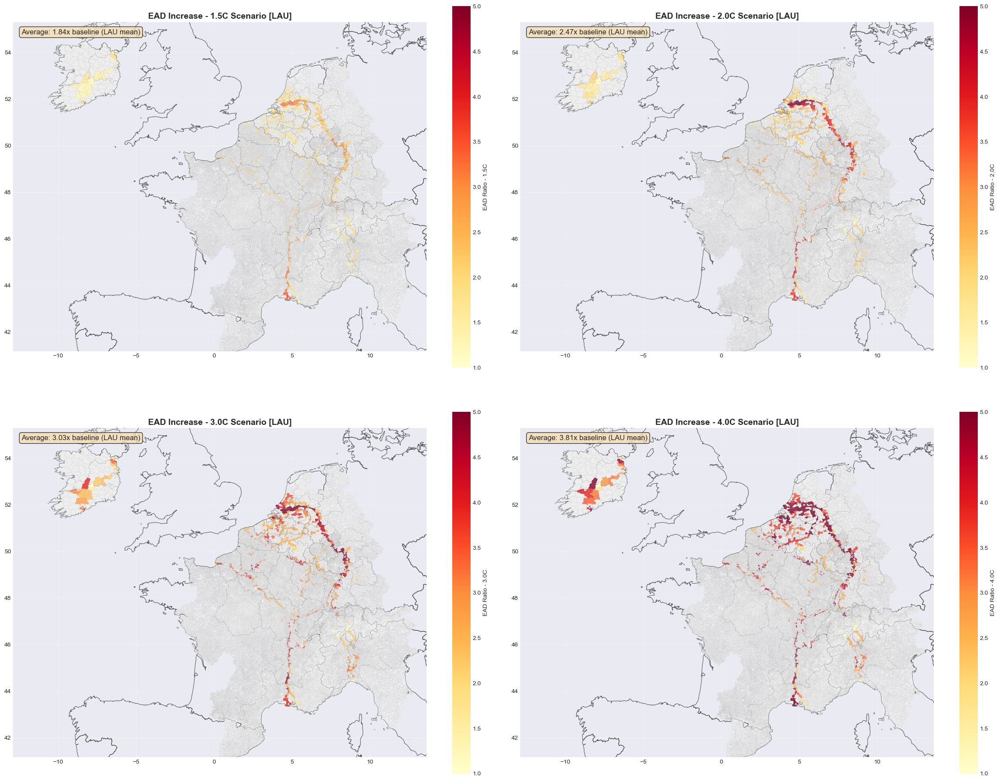

<Figure size 640x480 with 0 Axes>

In [14]:
# Interpolate damages for climate change scenarios
scenarios = ['1.5C', '2.0C', '3.0C', '4.0C']
return_periods = [10,20,30,40,50,75,100, 200, 500]

print("Interpolating damages for climate change scenarios...\n")

for scenario in scenarios:
    adj_rp_col = f'adjusted_rp_100_{scenario}'
    damage_col = f'damage_cc_{scenario}'
    
    if adj_rp_col in railway_with_risk.columns:
        railway_with_risk[damage_col] = railway_with_risk['mean_damage_100']
        
        # Print summary
        total_damage = railway_with_risk[damage_col].sum()
        avg_adj_rp = railway_with_risk[adj_rp_col].mean()
    else:
        print(f"{scenario}: Column {adj_rp_col} not found")

print("\nDamage interpolation completed")

fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()


# Filter to exposed assets - preserve GeoDataFrame structure
railway_cc = railway_with_risk[railway_with_risk['exposure_100'] > 0].copy()

# Check EAD columns for climate scenarios
ead_scenarios = ['1.5C', '2.0C', '3.0C', '4.0C']
ead_columns = [f'EAD_{scenario}' for scenario in ead_scenarios]

print("Checking EAD columns for climate scenarios:")
for col in ead_columns:
    if col in railway_with_risk.columns:
        total_ead = railway_with_risk[col].sum()
        print(f"  {col}: €{total_ead/1e6:.2f} million/year")
    else:
        print(f"  {col}: Not found")


# Plot EAD ratios for each climate scenario (scenario/baseline), from LAU-level results
for idx, scenario in enumerate(ead_scenarios):
    # '1.5C' -> '15', matching 05_aggregate_results_by_LAU.py's EAD_FUTURE_{key} columns for river hazard
    scenario_key = scenario.replace('.', '').replace('C', '')
    ead_future_col = f'EAD_FUTURE_{scenario_key}'
    ratio_col = f'_EAD_ratio_{scenario_key}'
    title = f'EAD Increase - {scenario} Scenario [LAU]'

    lau_ratio = lau_ead_eail.copy() if isinstance(lau_ead_eail, gpd.GeoDataFrame) else gpd.GeoDataFrame()
    if not lau_ratio.empty and ead_future_col in lau_ratio.columns and 'EAD' in lau_ratio.columns:
        lau_ratio[ratio_col] = (
            pd.to_numeric(lau_ratio[ead_future_col], errors='coerce')
            / pd.to_numeric(lau_ratio['EAD'], errors='coerce').replace(0, np.nan)
        )

    plotted = _utils.plot_lau_choropleth(
        axes[idx], lau_ratio, ratio_col, title, cmap='YlOrRd', vmin=1, vmax=5,
        legend_label=f'EAD Ratio - {scenario}', europe_countries=europe_countries,
    )
    if plotted is not None:
        avg_ratio = plotted[ratio_col].mean()
        axes[idx].text(0.02, 0.98, f'Average: {avg_ratio:.2f}x baseline (LAU mean)',
                      transform=axes[idx].transAxes, fontsize=12,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'EAD_future.png')

# 4. Indirect Losses: River flood assessment of freight railway system for the North Sea - Rhine - Mediterranean corridor

Indirect losses are those ones caused by the disruption of a given infrastructure, affecting the normal transport operation between two industrial facilities. Two types of economic impacts to industry emerged: losses from re-routing, and losses from isolation due to climate impacts. When freight is rerouted it can still reach its destination, but via longer, costlier alternative routes, increasing transport expenses across the supply chain. When freight is isolated, no viable alternative route exists and the industrial facility is entirely cut off from its supply chain resulting in the loss of the full economic value of the undelivered goods. By tracing freight flows back to the specific industries that depend on them, the model revealed that the minerals and metals sectors experience the greatest disruption, largely because of their heavy reliance on rail freight, the mode whose failure generated the largest supply chain impacts.

## 4.1 Expected Annual Indirect Losses (EAIL) – Present Day

This section computes and visualizes annual indirect losses (supply-chain disruption costs) aggregated by LAU under current climate conditions.


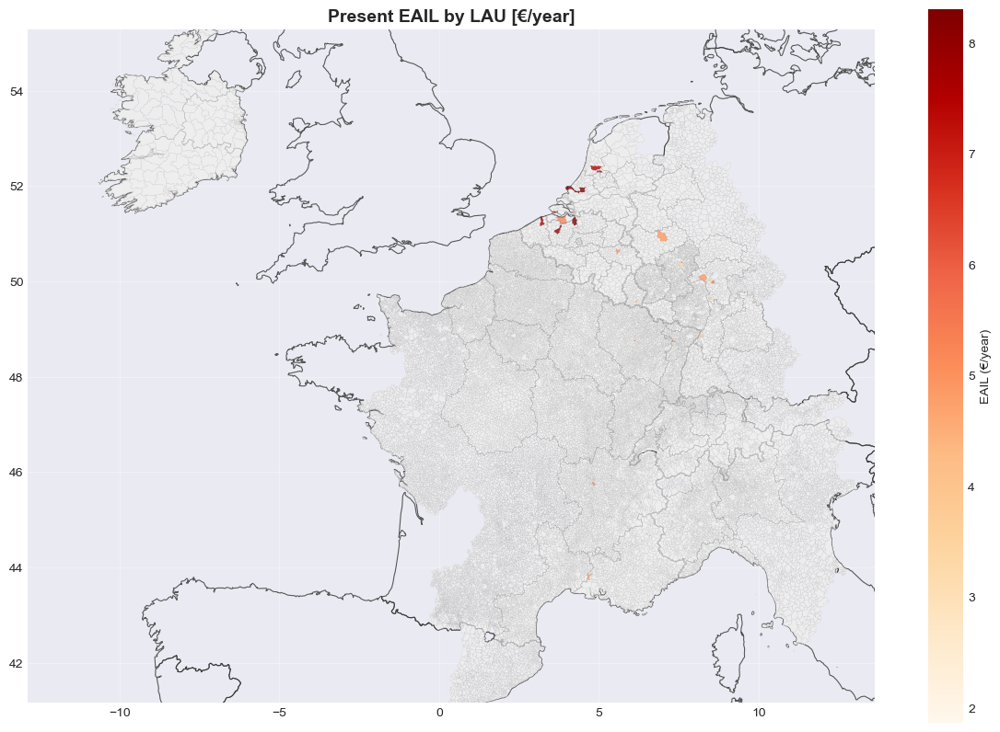

<Figure size 640x480 with 0 Axes>

In [16]:
fig_lau_eail, ax_lau_eail = plt.subplots(1, 1, figsize=(12, 10))
_utils.plot_lau_choropleth(
    ax_lau_eail, lau_ead_eail, 'EAIL', 'Present EAIL by LAU [€/year]',
    cmap='OrRd', log=True, legend_label='EAIL (€/year)', europe_countries=europe_countries,
)
plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'present_eail_lau_map.png')

## 4.2 Climate-projected EAIL Ratio Maps

This section projects how indirect losses (EAIL) will change under four climate warming scenarios. Ratio maps reveal which corridor segments face increased or decreased vulnerability as climate change alters flood frequency.

**Interpretation:**
- Ratios > 1: Future losses exceed present-day (risk escalation)
- Ratios < 1: Future losses are lower (rare; mainly where frequency offsets occur)
- Helps identify priority adaptation locations and timing

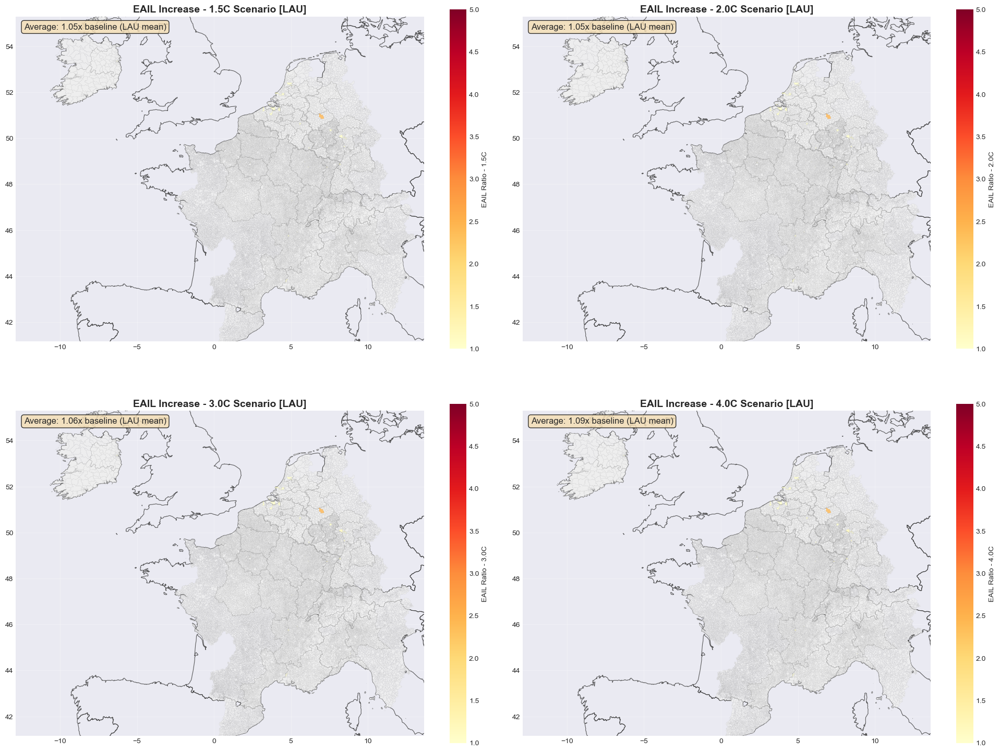

<Figure size 640x480 with 0 Axes>

In [17]:
fig_lau_eail_fut, axes_lau_eail_fut = plt.subplots(2, 2, figsize=(20, 16))
axes_lau_eail_fut = axes_lau_eail_fut.flatten()

eail_scenarios = ['15', '20', '30', '40']
eail_scenario_labels = {'15': '1.5C', '20': '2.0C', '30': '3.0C', '40': '4.0C'}

for idx, scen in enumerate(eail_scenarios):
    eail_future_col = f'EAIL_FUTURE_{scen}'
    ratio_col = f'_EAIL_ratio_{scen}'
    title = f'EAIL Increase - {eail_scenario_labels[scen]} Scenario [LAU]'

    lau_ratio = lau_ead_eail.copy() if isinstance(lau_ead_eail, gpd.GeoDataFrame) else gpd.GeoDataFrame()
    if not lau_ratio.empty and eail_future_col in lau_ratio.columns and 'EAIL' in lau_ratio.columns:
        lau_ratio[ratio_col] = (
            pd.to_numeric(lau_ratio[eail_future_col], errors='coerce')
            / pd.to_numeric(lau_ratio['EAIL'], errors='coerce').replace(0, np.nan)
        )

    plotted = _utils.plot_lau_choropleth(
        axes_lau_eail_fut[idx], lau_ratio, ratio_col, title, cmap='YlOrRd', vmin=1, vmax=5,
        legend_label=f'EAIL Ratio - {eail_scenario_labels[scen]}', europe_countries=europe_countries,
    )
    if plotted is not None:
        avg_ratio = plotted[ratio_col].mean()
        axes_lau_eail_fut[idx].text(
            0.02, 0.98, f'Average: {avg_ratio:.2f}x baseline (LAU mean)',
            transform=axes_lau_eail_fut[idx].transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
        )

plt.tight_layout()
plt.show()
plt.savefig(output_dir / 'eail_future_lau_map.png')

## 6. Cross-Corridor Hazard Comparison (Bar Charts)

The choropleth maps above show *where* losses concentrate within a single corridor/hazard. This section compares *across* corridors and hazards instead. Bars sum EAD/EAIL across all LAUs in a corridor, so a corridor with more/larger LAUs will naturally read higher; these are totals, not densities.

**Reading the charts:** every bar is a stack of two segments — a solid segment for EAD (direct damage) and a hatched (`///`) segment of the same color for EAIL (indirect loss) on top. Color never encodes the metric, only bar identity (infrastructure type or scenario), so EAD vs EAIL is always read from the hatch, never the hue.


In [25]:
# -- Discover and load every LAU-level result file across corridors/hazards --
import re

lau_result_specs = []
risk_root = root / 'inputs' / 'risk'
lau_file_pattern = re.compile(r'^LAU_.+\.parquet$', re.I)

if risk_root.exists():
    for p in sorted(risk_root.rglob('LAU_*.parquet')):
        if lau_file_pattern.match(p.name):
            lau_result_specs.append(p)

print(f"Found {len(lau_result_specs)} LAU result file(s) under {risk_root}:")

lau_all_parts = []
lau_skipped_files = []
for p in lau_result_specs:
    try:
        part = pd.read_parquet(p)
    except Exception as exc:
        print(f"  [WARN] {p.name}: failed to read ({exc}); skipping (file may be corrupted/truncated)")
        lau_skipped_files.append(p)
        continue
    part = part.drop(columns=['geometry'], errors='ignore')
    if 'CORRIDOR_ID' not in part.columns or 'HAZARD' not in part.columns:
        print(f"  [WARN] {p.name}: missing CORRIDOR_ID/HAZARD columns, skipping")
        lau_skipped_files.append(p)
        continue
    lau_all_parts.append(part)

if lau_skipped_files:
    print(f"\n[WARN] Skipped {len(lau_skipped_files)} unreadable/invalid file(s) -- these need regenerating:")
    for p in lau_skipped_files:
        print(f"  {p}")

lau_all_results = pd.concat(lau_all_parts, ignore_index=True) if lau_all_parts else pd.DataFrame()
if not lau_all_results.empty:
    print(f"\nCombined: {len(lau_all_results):,} LAU rows across "
          f"{lau_all_results['CORRIDOR_ID'].nunique()} corridor(s) and {lau_all_results['HAZARD'].nunique()} hazard(s)")
else:
    print("\n[WARN] No LAU result files loaded -- bar charts below will be empty.")

# -- Reshape into long form: one row per (corridor, hazard, infra_type, scenario, metric) --
lau_modes = [
    ('road_edge', 'Road'),
    ('rail_edge', 'Rail'),
    ('iww_port', 'IWW Port'),
    ('port', 'Port'),
    ('airport', 'Airport'),
]
lau_scenarios = [
    ('', 'Present'),
    ('_FUTURE_15', '1.5C'),
    ('_FUTURE_20', '2.0C'),
    ('_FUTURE_30', '3.0C'),
    ('_FUTURE_40', '4.0C'),
]

# Fixed categorical order/colors -- infrastructure type (used across all hazard charts)
INFRA_COLORS = {
    'Road': '#2a78d6',
    'Rail': '#eb6834',
    'IWW Port': '#1baf7a',
    'Port': '#eda100',
    'Airport': '#e87ba4',
}
# Fixed order/colors -- climate scenario severity ramp (river chart only)
SCENARIO_COLORS = {
    'Present': '#2ca02c',
    '1.5C': '#6baed6',
    '2.0C': '#08519c',
    '3.0C': '#fc9272',
    '4.0C': '#a50f15',
}
# Metric is encoded as a hatch pattern, not color, since color already carries infra-type/scenario identity
METRIC_HATCH = {'EAD': '', 'EAIL': '///'}

lau_bar_records = []
if not lau_all_results.empty:
    grouped = lau_all_results.groupby(['CORRIDOR_ID', 'HAZARD'])
    for (corridor_id, hazard), grp in grouped:
        for suffix, mode_label in lau_modes:
            for scen_suffix, scen_label in lau_scenarios:
                for metric in ('EAD', 'EAIL'):
                    col = f'{metric}{scen_suffix}_{suffix}'
                    if col in grp.columns:
                        total = pd.to_numeric(grp[col], errors='coerce').sum()
                        lau_bar_records.append({
                            'corridor': corridor_id, 'hazard': hazard,
                            'infra_type': mode_label, 'scenario': scen_label,
                            'metric': metric, 'value': total,
                        })

lau_bar_df = pd.DataFrame(lau_bar_records)
display(lau_bar_df)



Found 36 LAU result file(s) under c:\Users\cenv0972\Downloads\UC1\inputs\risk:

Combined: 1,081,960 LAU rows across 9 corridor(s) and 4 hazard(s)


,corridor,hazard,infra_type,scenario,metric,value
0,A,coastal,Road,Present,EAD,3.491348e+06
1,A,coastal,Road,Present,EAIL,0.000000e+00
2,A,coastal,Road,1.5C,EAD,0.000000e+00
3,A,coastal,Road,1.5C,EAIL,0.000000e+00
4,A,coastal,Road,2.0C,EAD,0.000000e+00
...,...,...,...,...,...,...
1795,L,windstorm,Airport,2.0C,EAIL,0.000000e+00
1796,L,windstorm,Airport,3.0C,EAD,0.000000e+00
1797,L,windstorm,Airport,3.0C,EAIL,0.000000e+00
1798,L,windstorm,Airport,4.0C,EAD,0.000000e+00


### 6.1 Present-day EAD + EAIL by corridor and infrastructure type

One figure per hazard (coastal, earthquake, river, windstorm). Within each figure, corridors are grouped on the x-axis and each corridor's group has one bar per infrastructure type (road / rail / IWW port / port / airport), present-day scenario only. Bar height is EAD + EAIL combined; the solid-vs-hatched split shows the direct/indirect balance for that mode.

Use these to spot, per hazard: (a) which corridor carries the most present-day risk, and (b) which infrastructure type drives it, e.g. whether losses are concentrated in ports (often indirect-loss-heavy) or road/rail (often direct-damage-heavy).


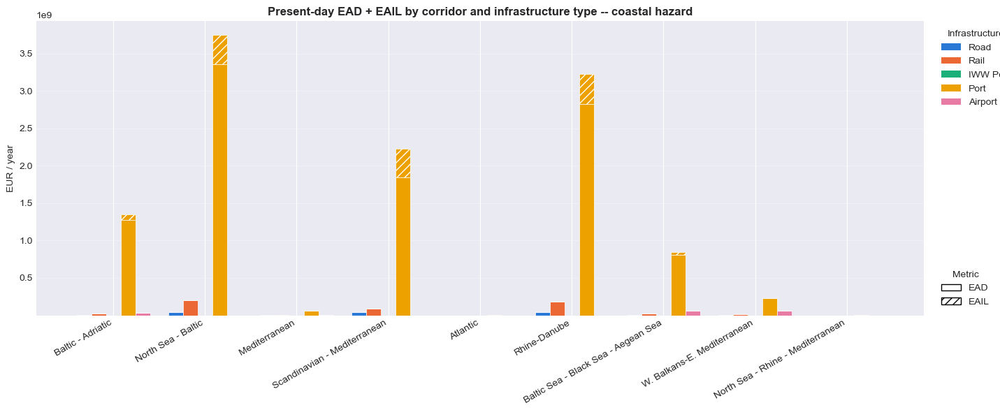

<Figure size 640x480 with 0 Axes>

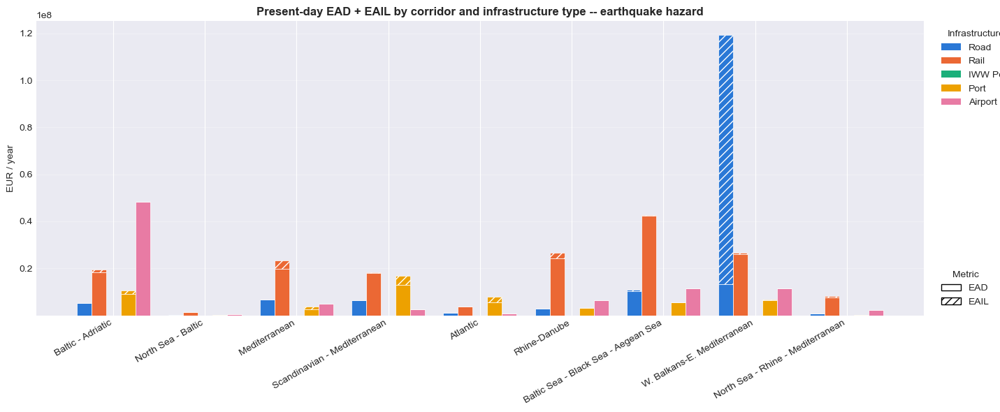

<Figure size 640x480 with 0 Axes>

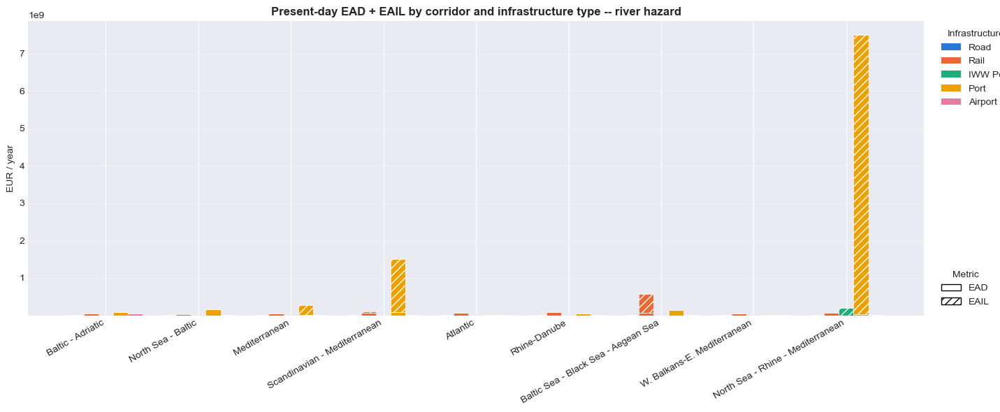

<Figure size 640x480 with 0 Axes>

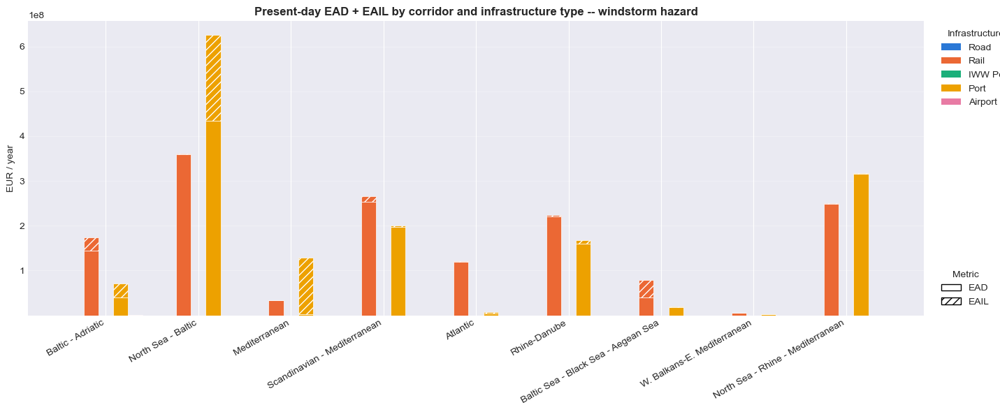

<Figure size 640x480 with 0 Axes>

In [23]:
# -- 4 hazard charts (present-day): x = corridor group, bar = infrastructure type, stacked EAD (solid) + EAIL (hatched) --
from matplotlib.patches import Patch

if lau_bar_df.empty:
    print("No data to plot (no LAU result files found).")
else:
    present_df = lau_bar_df[lau_bar_df['scenario'] == 'Present']
    mode_order = [label for _, label in lau_modes]
    hazards = sorted(present_df['hazard'].unique())

    for hazard in hazards:
        haz_df = present_df[present_df['hazard'] == hazard]
        corridors = sorted(haz_df['corridor'].unique())
        n_corridors = len(corridors)
        n_modes = len(mode_order)
        width = 0.8 / n_modes

        fig, ax = plt.subplots(figsize=(max(10, 1.6 * n_corridors), 6))
        group_x = np.arange(n_corridors)

        for i, mode_label in enumerate(mode_order):
            offset = (i - (n_modes - 1) / 2) * width
            ead_vals = np.zeros(n_corridors)
            eail_vals = np.zeros(n_corridors)
            for j, corridor in enumerate(corridors):
                row = haz_df[(haz_df['corridor'] == corridor) & (haz_df['infra_type'] == mode_label)]
                ead_row = row[row['metric'] == 'EAD']['value']
                eail_row = row[row['metric'] == 'EAIL']['value']
                ead_vals[j] = ead_row.iloc[0] if len(ead_row) else 0.0
                eail_vals[j] = eail_row.iloc[0] if len(eail_row) else 0.0

            ax.bar(group_x + offset, ead_vals, width, color=INFRA_COLORS[mode_label],
                   hatch=METRIC_HATCH['EAD'], edgecolor='white', linewidth=0.5)
            ax.bar(group_x + offset, eail_vals, width, bottom=ead_vals, color=INFRA_COLORS[mode_label],
                   hatch=METRIC_HATCH['EAIL'], edgecolor='white', linewidth=0.5)

        ax.set_xticks(group_x)
        ax.set_xticklabels([corridor_names.get(c, c) for c in corridors], rotation=30, ha='right')
        ax.set_ylabel('EUR / year')
        ax.set_title(f'Present-day EAD + EAIL by corridor and infrastructure type -- {hazard} hazard',
                      fontsize=12, fontweight='bold')
        ax.grid(True, axis='y', alpha=0.3)

        infra_legend = [Patch(facecolor=INFRA_COLORS[m], label=m) for m in mode_order]
        metric_legend = [Patch(facecolor='white', edgecolor='black', hatch=METRIC_HATCH[m], label=m) for m in ('EAD', 'EAIL')]
        legend1 = ax.legend(handles=infra_legend, title='Infrastructure', loc='upper left', bbox_to_anchor=(1.01, 1))
        ax.add_artist(legend1)
        ax.legend(handles=metric_legend, title='Metric', loc='lower left', bbox_to_anchor=(1.01, 0))

        plt.tight_layout()
        plt.show()
        plt.savefig(output_dir / f'ead_eail_by_corridor_infra_{hazard}.png', bbox_inches='tight')


### 6.2 River flood: EAD + EAIL by corridor and climate scenario

River flood only, all infrastructure types combined. Corridors are grouped on the x-axis; each corridor's group has one bar per climate scenario — present-day (green), then increasing warming through light blue (1.5°C), dark blue (2.0°C), light red (3.0°C), to dark red (4.0°C). The color ramp is a deliberate severity cue: green = current climate, blue = moderate warming, red = severe warming.

As in 6.1, each bar's solid segment is EAD and its hatched segment is EAIL. Reading left-to-right within a corridor's group shows how much (and how fast) river-flood losses are projected to grow under climate change, and whether that growth is driven more by direct damage or indirect disruption.


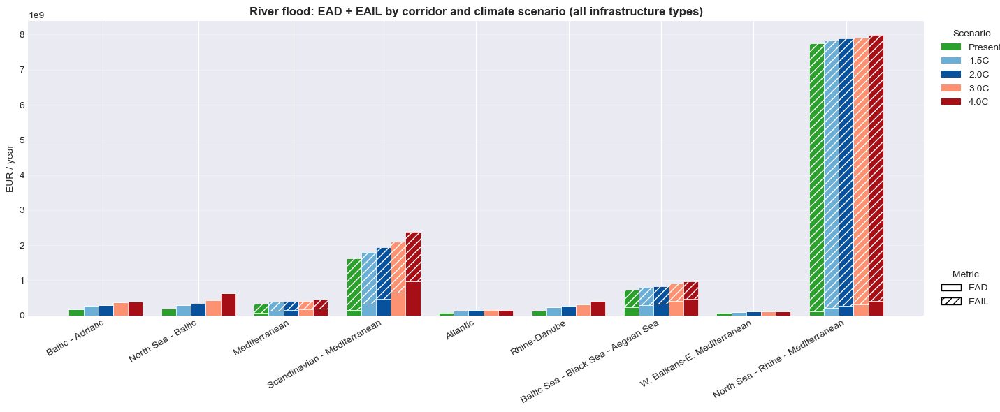

<Figure size 640x480 with 0 Axes>

In [24]:
# -- River-flood scenario chart: x = corridor group, bar = climate scenario, stacked EAD (solid) + EAIL (hatched) --
from matplotlib.patches import Patch

river_df = lau_bar_df[lau_bar_df['hazard'].str.lower() == 'river'] if not lau_bar_df.empty else lau_bar_df

if river_df.empty:
    print("No river-flood data to plot.")
else:
    scen_order = [label for _, label in lau_scenarios]
    corridors = sorted(river_df['corridor'].unique())
    n_corridors = len(corridors)
    n_scen = len(scen_order)
    width = 0.8 / n_scen

    fig, ax = plt.subplots(figsize=(max(10, 1.6 * n_corridors), 6))
    group_x = np.arange(n_corridors)

    for i, scen_label in enumerate(scen_order):
        offset = (i - (n_scen - 1) / 2) * width
        ead_vals = np.zeros(n_corridors)
        eail_vals = np.zeros(n_corridors)
        for j, corridor in enumerate(corridors):
            sub = river_df[(river_df['corridor'] == corridor) & (river_df['scenario'] == scen_label)]
            ead_row = sub[sub['metric'] == 'EAD'].groupby('corridor')['value'].sum()
            eail_row = sub[sub['metric'] == 'EAIL'].groupby('corridor')['value'].sum()
            ead_vals[j] = ead_row.sum() if len(ead_row) else 0.0
            eail_vals[j] = eail_row.sum() if len(eail_row) else 0.0

        ax.bar(group_x + offset, ead_vals, width, color=SCENARIO_COLORS[scen_label],
               hatch=METRIC_HATCH['EAD'], edgecolor='white', linewidth=0.5)
        ax.bar(group_x + offset, eail_vals, width, bottom=ead_vals, color=SCENARIO_COLORS[scen_label],
               hatch=METRIC_HATCH['EAIL'], edgecolor='white', linewidth=0.5)

    ax.set_xticks(group_x)
    ax.set_xticklabels([corridor_names.get(c, c) for c in corridors], rotation=30, ha='right')
    ax.set_ylabel('EUR / year')
    ax.set_title('River flood: EAD + EAIL by corridor and climate scenario (all infrastructure types)',
                  fontsize=12, fontweight='bold')
    ax.grid(True, axis='y', alpha=0.3)

    scen_legend = [Patch(facecolor=SCENARIO_COLORS[s], label=s) for s in scen_order]
    metric_legend = [Patch(facecolor='white', edgecolor='black', hatch=METRIC_HATCH[m], label=m) for m in ('EAD', 'EAIL')]
    legend1 = ax.legend(handles=scen_legend, title='Scenario', loc='upper left', bbox_to_anchor=(1.01, 1))
    ax.add_artist(legend1)
    ax.legend(handles=metric_legend, title='Metric', loc='lower left', bbox_to_anchor=(1.01, 0))

    plt.tight_layout()
    plt.show()
    plt.savefig(output_dir / 'ead_eail_by_corridor_scenario_river.png', bbox_inches='tight')
